# Anomalous sound detection: Exploratory data analysis of train dataset

In [1]:
#Let's first import the module that we will need
import librosa
import IPython.display as ipd
import librosa.display
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches
#%matplotlib notebook
%matplotlib inline

In [9]:
#Constant used throughout the notebook
PATH_DATASET = r"../data/data"

Let's first create dataframes for all machine types containing the filename of each sample, its section and type of sound.

In [10]:
def build_dataframe(machine_str = 'valve'):
    #Get list of files in train and test directory
    path_train_folder = PATH_DATASET + "/dev_" + machine_str + "/" + machine_str + "/train"
    path_test_folder = PATH_DATASET  + "/dev_" + machine_str + "/" + machine_str + "/test"

    train_files = [f for f in os.listdir(path_train_folder)]
    test_files = [f for f in os.listdir(path_test_folder)]

    #Get list of dictionnary for creating DataFrame
    list_dict_file = []

    #Loop through filenames
    for filename in train_files:

        #Get filename as list of string
        splitted_filename = filename.split('_')

        #Append dictionnary to list
        list_dict_file.append({
            'filepath' : path_train_folder + "/" + filename,
            'filename' : filename,
            'section' : int(splitted_filename[1]),
            'domain_env' : splitted_filename[2],
            'dir' : splitted_filename[3],
            'sound_type' : splitted_filename[4],
            'id' : splitted_filename[5],
            'suffix' : '_'.join(splitted_filename[6:]).split('.wav')[0]  
        })

    #Loop through filenames
    for filename in test_files:

        #Get filename as list of string
        splitted_filename = filename.split('_')

        #Append dictionnary to list
        list_dict_file.append({
            'filepath' : path_test_folder  + "/" + filename,
            'filename' : filename,
            'section' : int(splitted_filename[1]),
            'domain_env' : splitted_filename[2],
            'dir' : splitted_filename[3],
            'sound_type' : splitted_filename[4],
            'id' : splitted_filename[5],
            'suffix' : '_'.join(splitted_filename[6:]).split('.wav')[0] 
        })
        
    return pd.DataFrame(list_dict_file)


def sound_from_file(filename, machine_str = 'valve', dataset = 'train'):
    df = build_dataframe(machine_str)
    path = PATH_DATASET + "/dev_" + machine_str + "/" + machine_str + "/" + dataset + "/" + filename
    return df[df['filepath']==path].iloc[0]
    


df_fan = build_dataframe('fan')
df_valve = build_dataframe('valve')
df_bearing = build_dataframe('bearing')
df_slider = build_dataframe('slider')
df_car = build_dataframe('ToyCar')
df_train = build_dataframe('ToyTrain')
df_gearbox = build_dataframe('gearbox')

df_fan.info()
df_gearbox.head()



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3600 entries, 0 to 3599
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   filepath    3600 non-null   object
 1   filename    3600 non-null   object
 2   section     3600 non-null   int64 
 3   domain_env  3600 non-null   object
 4   dir         3600 non-null   object
 5   sound_type  3600 non-null   object
 6   id          3600 non-null   object
 7   suffix      3600 non-null   object
dtypes: int64(1), object(7)
memory usage: 225.1+ KB


,filepath,filename,section,domain_env,dir,sound_type,id,suffix
0,../data/data/dev_gearbox/gearbox/train/section...,section_00_source_train_normal_0000_volt_1.0.wav,0,source,train,normal,0000,volt_1.0
1,../data/data/dev_gearbox/gearbox/train/section...,section_00_source_train_normal_0001_volt_2.5.wav,0,source,train,normal,0001,volt_2.5
2,../data/data/dev_gearbox/gearbox/train/section...,section_00_source_train_normal_0002_volt_1.5.wav,0,source,train,normal,0002,volt_1.5
3,../data/data/dev_gearbox/gearbox/train/section...,section_00_source_train_normal_0003_volt_2.0.wav,0,source,train,normal,0003,volt_2.0
4,../data/data/dev_gearbox/gearbox/train/section...,section_00_source_train_normal_0004_volt_1.0.wav,0,source,train,normal,0004,volt_1.0


### Have a look at the sample distribution in the different sections, attributes, domains

Which machine to study?

In [11]:
machine_str = 'gearbox'

Run the next cell to see the sample distribution

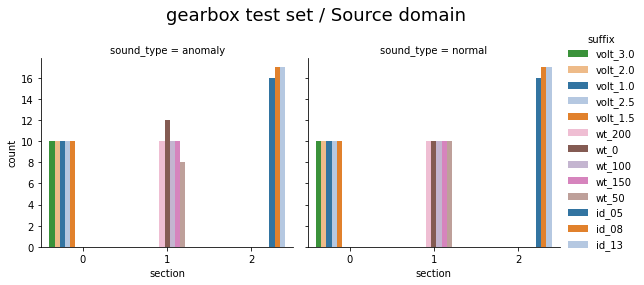

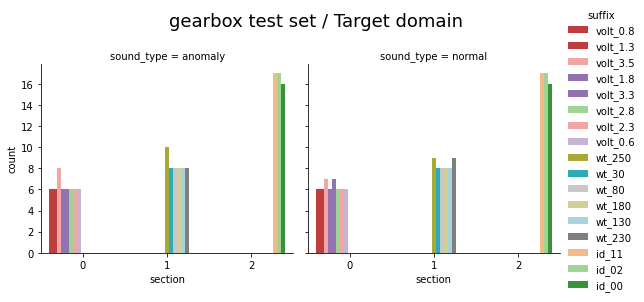

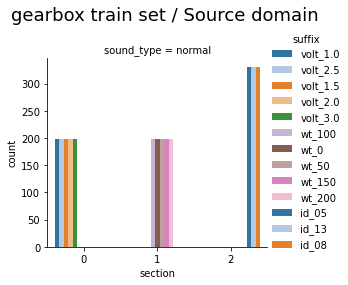

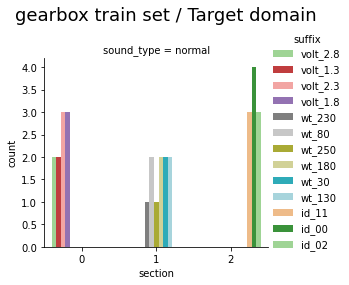

In [12]:
data = build_dataframe(machine_str)

# Discrete colormap 
attributes_lst = list(data['suffix'].unique())
palette = sns.color_palette("tab20", len(attributes_lst))
#display(palette)

dict_color = {}
for attribute in attributes_lst:
    dict_color[attribute] = palette[attributes_lst.index(attribute)]

%matplotlib inline
# Test set
data_test = data[data['dir']=='test']

f = sns.catplot(data = data_test[data_test['domain_env']=='source'], \
                kind = 'count', x = 'section', hue = 'suffix', col='sound_type', palette = dict_color, height = 4)
f.fig.subplots_adjust(top=0.8)    # adjust the plot height in f
f.fig.suptitle(machine_str + " test set / Source domain", size = 18)

f = sns.catplot(data = data_test[data_test['domain_env']=='target'], \
                kind = 'count', x = 'section', hue = 'suffix', col='sound_type', palette = dict_color, height = 4)
f.fig.subplots_adjust(top=0.8)    # adjust the plot height in f
f.fig.suptitle(machine_str + " test set / Target domain", size = 18);


# Train set
data_train = data[data['dir']=='train']

f = sns.catplot(data = data_train[data_train['domain_env']=='source'], \
                kind = 'count', x = 'section', hue = 'suffix', col='sound_type', palette = dict_color, height = 4)
f.fig.subplots_adjust(top=0.8)    # adjust the plot height in f
f.fig.suptitle(machine_str + " train set / Source domain", size = 18)

f = sns.catplot(data = data_train[data_train['domain_env']=='target'], \
                kind = 'count', x = 'section', hue = 'suffix', col='sound_type', palette = dict_color, height = 4)
f.fig.subplots_adjust(top=0.8)    # adjust the plot height in f
f.fig.suptitle(machine_str + " train set / Target domain", size = 18);



We see there is no attribute overlap between source and target domains.

In [13]:
data[data['section']==0]['suffix'].unique()

array(['volt_1.0', 'volt_2.5', 'volt_1.5', 'volt_2.0', 'volt_3.0',
       'volt_2.8', 'volt_1.3', 'volt_2.3', 'volt_1.8', 'volt_0.8',
       'volt_3.5', 'volt_3.3', 'volt_0.6'], dtype=object)

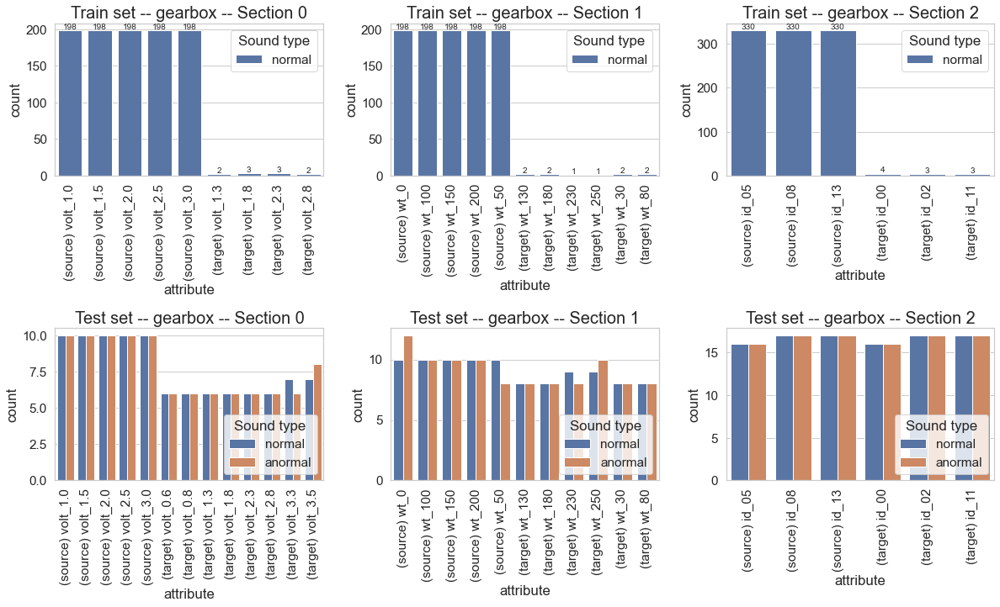

In [14]:
machine_str = 'gearbox'
data = build_dataframe(machine_str)

%matplotlib inline


# Arrange the dataframe to be used
data_train = data[data['dir']=='train'].copy()
data_test = data[data['dir']=='test'].copy()

data_test['sound_type'] = data_test['sound_type'].replace(['normal', 'anomaly'], ['normal', 'anormal'])

# New column showing the suffix and the domain
data_test['attribute'] = data_test.apply(lambda row: '(' + row['domain_env'] + ') ' + row['suffix'], axis = 1)
data_train['attribute'] = data_train.apply(lambda row: '(' + row['domain_env'] + ') ' + row['suffix'], axis = 1)
#display(data_test.head())


# Plotting
sns.set_theme(style="whitegrid", font_scale = 1.4)
fig = plt.figure(figsize = (20, 10))

gs = gridspec.GridSpec(2, 3, wspace=0.25, hspace=1.0, height_ratios=None, figure=fig)

# Plot for the train set
for i in range(3):
    ax = fig.add_subplot(gs[0, i])
    # Order the attributes ie the columns in the countplot
    order_list = sorted(data_train[(data_train['section']==i) & (data_train['domain_env']=='source')]['attribute']\
                                .unique().tolist()) \
                 + sorted(data_train[(data_train['section']==i) & (data_train['domain_env']=='target')]['attribute']\
                                .unique().tolist()) 
    ax2 = sns.countplot(data = data_train[data_train['section']==i], \
                        x = 'attribute', order = order_list, hue = 'sound_type', orient = 'v',  ax = ax)

    for container in ax2.containers:
        ax2.bar_label(container, size = 10)     # shows the value of each column  

    ax2.set_title('Train set -- '+ machine_str + ' -- Section '+str(i), fontsize = 20)
    plt.tick_params(axis='x', rotation=90)
    plt.legend(loc='upper right', title = 'Sound type')
    
# Plot for the test set    
for i in range(3):
    ax = fig.add_subplot(gs[1, i])
    # Order the attributes ie the columns in the countplot
    order_list = sorted(data_test[(data_test['section']==i) & (data_test['domain_env']=='source')]['attribute']\
                                .unique().tolist()) \
                 + sorted(data_test[(data_test['section']==i) & (data_test['domain_env']=='target')]['attribute']\
                                .unique().tolist()) 
    ax2 = sns.countplot(data = data_test[data_test['section']==i], \
                        x = 'attribute', order = order_list, hue = 'sound_type', hue_order = ['normal', 'anormal'], \
                        orient = 'v', dodge=True, ax = ax)

    #for container in ax2.containers:
    #    ax2.bar_label(container)     # shows the value of each column  

    ax2.set_title('Test set -- '+ machine_str + ' -- Section '+str(i), fontsize = 20)
    plt.tick_params(axis='x', rotation=90)
    plt.legend(loc='lower right', title = 'Sound type')
    


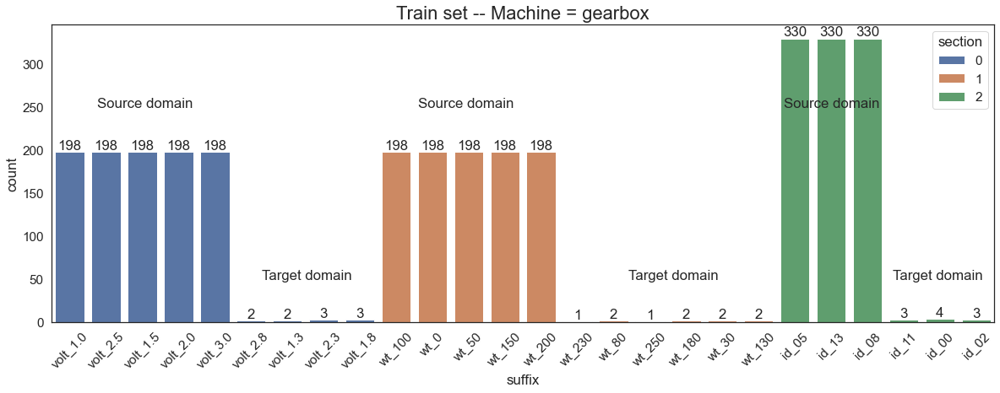

In [15]:
data = build_dataframe(machine_str)

%matplotlib inline
# Test set
data_train = data[data['dir']=='train']
data_test = data[data['dir']=='test']

#Plot for train set
sns.set_theme(style="white", font_scale = 1.4)
fig= plt.figure(figsize = (20, 6.5))
ax1 = sns.countplot(data = data_train, x = 'suffix', hue = 'section', orient = 'v', dodge = False)
#ax1.set_yscale('log')
ax1.text(0.75, 250, 'Source domain')
ax1.text(9.6, 250, 'Source domain')
ax1.text(19.7, 250, 'Source domain')
ax1.text(5.3, 50, 'Target domain')
ax1.text(15.4, 50, 'Target domain')
ax1.text(22.7, 50, 'Target domain')

for container in ax1.containers:
    ax1.bar_label(container)     # shows the value of each column  
    
ax1.set_title('Train set -- Machine = ' + machine_str, fontsize = 22)
plt.tick_params(axis='x', rotation=45)





## Generic librosa-based functions

In [16]:
def load_audio(file_path):
    y, sr = librosa.load(file_path, sr = None)
    return y, sr

def plot_audio(audio_data, sr, ax, xlim = (0, 10), title = None):
    times =  1/sr * np.arange(0, len(audio_data))
    ax.plot(times, audio_data)
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Amplitude')
    ax.set_xlim(xlim)
    ax.set_title(title)
    
def plot_dft_amplitude(audio_data, sr, ax = None, title = None):
    y_fourier = np.abs(np.fft.fft(audio_data))[:len(audio_data)//2]      # To be clarified
    plt.bar(sr/(2*len(y_fourier))*np.arange(len(y_fourier)), y_fourier)
    ax.set_xlabel('Frequency (Hz)')
    ax.set_ylabel('Amplitude')
    ax.set_title(title)
    
def plot_dft_phase(audio_data, sr, ax = None, title = None):
    y_fourier = np.angle(np.fft.fft(audio_data))[:len(audio_data)//2]      # To be clarified
    plt.bar(sr/(2*len(y_fourier))*np.arange(len(y_fourier)), y_fourier)
    ax.set_xlabel('Frequency (Hz)')
    ax.set_ylabel('Phase')
    ax.set_title(title)
    
def spectrogram(audio, n_fft = 2048, hop_length = 2048):
    spectrum = librosa.stft(audio, n_fft = n_fft, hop_length = hop_length, center = False)
    magnitude, phase = librosa.magphase(spectrum)
    # or ref=np.max / ref = 1e-6 corresponds to the threshold intensity for humans = 1e-12 W/m2
    # Not sure of the units. Does not matter, I just want a fixed ref for all plots
    return  librosa.amplitude_to_db(magnitude, ref=1e-6), np.angle(phase) 

def melspectrogram(audio, sr, n_fft = 2048, hop_length = 2048):
    M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)
    M_db = librosa.power_to_db(M, ref=1e-12)   # or ref=np.max
    return M_db

def plot_mag_spectrogram(audio, sr, n_fft = 2048, hop_length = 2048, scale = 'linear', ax = None, \
                         title = None, vmin = None, vmax = None):
    magnitude, phase = spectrogram(audio, n_fft = n_fft, hop_length = hop_length)
    img = librosa.display.specshow(magnitude, sr = sr, n_fft = n_fft, hop_length = hop_length, \
                                   y_axis = scale, x_axis ='time', ax = ax, vmin = vmin, vmax = vmax)
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Frequency (Hz)')
    ax.set_title(title)
    cbar = plt.colorbar(img, ax=ax, format="%+2.f dB")
    cbar.set_label('Intensity')

def plot_phase_spectrogram(audio, sr, n_fft = 2048, hop_length = 2048, scale = 'linear', ax = None, \
                           title = None, vmin = None, vmax = None):
    magnitude, phase = spectrogram(audio, n_fft = n_fft, hop_length = hop_length)
    img = librosa.display.specshow(phase, sr = sr, n_fft = n_fft, hop_length = hop_length, \
                                   y_axis = scale, x_axis = 'time', ax = ax, vmin = vmin, vmax = vmax)
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Frequency (Hz)')
    ax.set_title(title)
    cbar = plt.colorbar(img, ax=ax)
    cbar.set_label('Phase')
    
def plot_mag_melspectrogram(audio, sr, n_fft = 2048, hop_length = 2048, ax = None, \
                            title = None, vmin = None, vmax = None):
    M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)
    M_db = librosa.power_to_db(M, ref=1e-12)   # or ref=np.max
    img = librosa.display.specshow(M_db, sr = sr, n_fft = n_fft, hop_length = hop_length, \
                                   y_axis = 'mel', x_axis ='time', ax = ax, vmin = vmin, vmax = vmax)
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Frequency (Mel)')
    ax.set_title(title)
    cbar = plt.colorbar(img, ax=ax, format="%+2.f dB")
    cbar.set_label('Intensity')

    
    


### Some tests on a known signal $y(t)=\sin(2\pi f_1 t)+ \sin(2\pi f_2 t)$

<IPython.core.display.Javascript object>


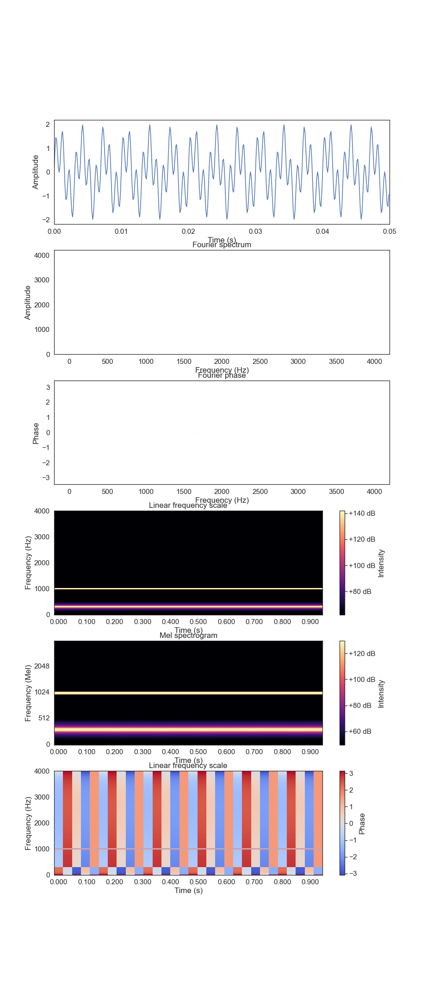

C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:63: FutureWarning: Pass y=[ 0.          0.94055215  1.4539905  ... -1.35655483 -1.4539905
 -0.94055215] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)


In [17]:
duration = 1  # seconde
f1, f2 = 300, 1000
sr = 8000
dt = 1/sr
t = dt*np.arange(sr*duration)
audio_1 = np.sin(2*np.pi*f1*t) + np.sin(2*np.pi*f2*t)  # sin(w*t)

%matplotlib notebook
fig = plt.figure(figsize = (13, 30), num = "Test on a superposition of two sin")
gs = gridspec.GridSpec(6, 1, wspace=0.25, hspace=0.25, height_ratios=None, figure=fig)

ax = fig.add_subplot(gs[0, 0])
plot_audio(audio_1[:400], sr, ax = ax, xlim = (0, 0.05))

ax = fig.add_subplot(gs[1, 0])
plot_dft_amplitude(audio_1, sr, ax = ax, title = 'Fourier spectrum')

ax = fig.add_subplot(gs[2, 0])
plot_dft_phase(audio_1, sr, ax = ax, title = 'Fourier phase')

n_fft = 512      # puissances de 2 : 512, 2048, 4096, 8192, 16384 etc ...
ax = fig.add_subplot(gs[3, 0])
plot_mag_spectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2), scale = 'linear', \
                     ax = ax, title = 'Linear frequency scale')
ax = fig.add_subplot(gs[4, 0])
plot_mag_melspectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                        ax = ax, title = 'Mel spectrogram')
ax = fig.add_subplot(gs[5, 0])
plot_phase_spectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2), scale = 'linear', \
                       ax = ax, title = 'Linear frequency scale')




**Problem**: for 'large' frequency e.g. $f=1000$ Hz, the peak is not present in the Fourier spectrum (while it is present for $f\lesssim500$ Hz). Is there a problem coming from Shannon's theorem? It would be weird since $s_r/2 \gg 1000$. It might be due to the fft implementation which is not good enough when the number of points $n_{fft}$ used for the fft is not a power of 2. 

## Sound analysis
### $\longrightarrow$ compare sounds by pair, eg normal *vs* anormal, source domain *vs* target domain, ...

In [18]:
# Generic function to select two sounds with different comp_feature, among sounds filtered with machine_str, features_dict
def choose_two_sounds_to_compare(machine_str, features_dict, comp_feature = 'sound_type', seed_att = 1, seed_sample = 1):
    def pick_random_common_attribute(audio_df_1, audio_df_2, seed = 1):
        # Random choice of the attribute between common attributes of audio_df_1 and audio_df_2
        np.random.seed(seed)
        common_attributes = np.intersect1d(audio_df_1['suffix'], audio_df_2['suffix'])
        if len(common_attributes) == 0:
            raise ValueError("There is no common attributes between the two filtered data sets. \
                             Please choose two other input data sets.")
        attribute = np.random.choice(common_attributes, 1)[0]
        
        # ... filter the dataframes
        filtered_df_1 = audio_df_1[audio_df_1['suffix']==attribute]
        filtered_df_2 = audio_df_2[audio_df_2['suffix']==attribute]
        
        return filtered_df_1, filtered_df_2
    
    def pick_random_attribute(audio_df, seed = 1):
        # Random choice of the attribute 
        np.random.seed(seed)
        attributes = audio_df['suffix'].unique()
        attribute = np.random.choice(attributes, 1)[0]
        filtered_df = audio_df[audio_df['suffix']==attribute]
        
        return filtered_df
    
    def pick_random_sample(audio_df, seed = 1):
        # Choose randomly one sample in the dataframe
        np.random.seed(seed)
        c = audio_df['id'].count()
        which_sample = np.random.randint(low = 0, high = c, size = 1)[0]
        #print(which_sample)
        filtered_df = audio_df.iloc[which_sample]
        
        return filtered_df
    
    #*******************
    data = build_dataframe(machine_str)
    
    # Filter the dataframe
    if comp_feature == 'sound_type':         # we will select a pair of normal and anormal sounds
        data = data[(data['dir']=='test') & \
                          (data['domain_env']==features_dict['domain']) & \
                          (data['section']==features_dict['section'])]

        data_1 = data[data['sound_type']=='normal']
        data_2 = data[data['sound_type']=='anomaly']
        
        data_1, data_2 = pick_random_common_attribute(data_1, data_2, seed = seed_att)
        data_1 = pick_random_sample(data_1, seed = seed_sample)
        data_2 = pick_random_sample(data_2, seed = seed_sample + 1)
        
    # Filter the dataframe
    elif comp_feature == 'domain_env':         # we will select a pair of sounds from the source and target domains
        data = data[(data['dir']==features_dict['dir']) & \
                    (data['sound_type']==features_dict['sound_type']) & \
                    (data['section']==features_dict['section'])]

        data_1 = data[data['domain_env']=='source']
        data_2 = data[data['domain_env']=='target']
        
        data_1 = pick_random_attribute(data_1, seed = seed_att)
        data_2 = pick_random_attribute(data_2, seed = seed_att + 123)
        data_1 = pick_random_sample(data_1, seed = seed_sample)
        data_2 = pick_random_sample(data_2, seed = seed_sample + 123)
        
    elif comp_feature == 'samples_with_same_attribute':         # we will select a pair of normal and anormal sounds
        data = data[(data['dir']=='train') & \
                    (data['domain_env']==features_dict['domain']) & \
                    (data['section']==features_dict['section']) & \
                    (data['sound_type']=='normal')]
        
        data = pick_random_attribute(data, seed = seed_att)

        data_1 = pick_random_sample(data, seed = seed_sample)
        data_2 = pick_random_sample(data, seed = seed_sample + 123)

    else:
        """ Not yet implemented """
        print("'comp_feature' is not known")
    
    return data_1, data_2


        

### Case 1 - Compare normal vs anormal sounds with the same domain, section, and attributes
Sounds are necessarily from the test set since there is no anormal sounds in the train set

In [19]:
# Choose the features here
machine_str = 'gearbox'
comp_feature = 'sound_type'      # We will compare two sounds wih different sound_type ie normal and anormal sounds
features_dict = {'domain': 'source',     # 'source' or 'target'
                 'section': 1         # 0, 1, or 2 (note we are only looking at the dev set for now)
                }

seed_att = 12      # For random selection of the attribute in the same domain and in the same section
seed_sample = 1         # Choose randomly among the samples which are filtered

# Filter the data set accordindly
sound_1, sound_2 = choose_two_sounds_to_compare(machine_str, features_dict, comp_feature = comp_feature, \
                                                seed_att = seed_att, seed_sample = seed_sample)


#### Hear normal vs anormal sounds

In [20]:
print("Machine = ", machine_str)

print("--> Normal sound")
print(sound_1['filename'])
audio_1, sr = load_audio(sound_1['filepath'])
display(ipd.Audio(audio_1, rate = sr))

print("--> Anormal sound")
print(sound_2['filename'])
audio_2, sr = load_audio(sound_2['filepath'])
display(ipd.Audio(audio_2, rate = sr))



Machine =  gearbox
--> Normal sound
section_01_source_test_normal_0032_wt_200.wav


--> Anormal sound
section_01_source_test_anomaly_0041_wt_200.wav


In the anormal sound 'section_01_source_test_anomaly_0041_wt_200.wav' (obtained here with seed_att = 12, seed_sample = 1), there are 2 high-pitched sound events at $t \approx 4$ and $6$ s.

In the anormal sound 'section_01_source_test_anomaly_0018_wt_200.wav' (obtained here with seed_att = 12, seed_sample = 6), there is a sound background between $t=0$ till $t\approx 6$s.

### Analyse sound plot and various spectra
**Be careful** that the dB reference scale and colormap vmin/vmax are different for the two sounds on each row.
This should be corrected.

C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:63: FutureWarning: Pass y=[-0.00183105 -0.00521851 -0.02407837 ... -0.03848267 -0.03018188
  0.00390625] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)
C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:63: FutureWarning: Pass y=[0.0289917  0.02227783 0.01998901 ... 0.02227783 0.03146362 0.03305054] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)


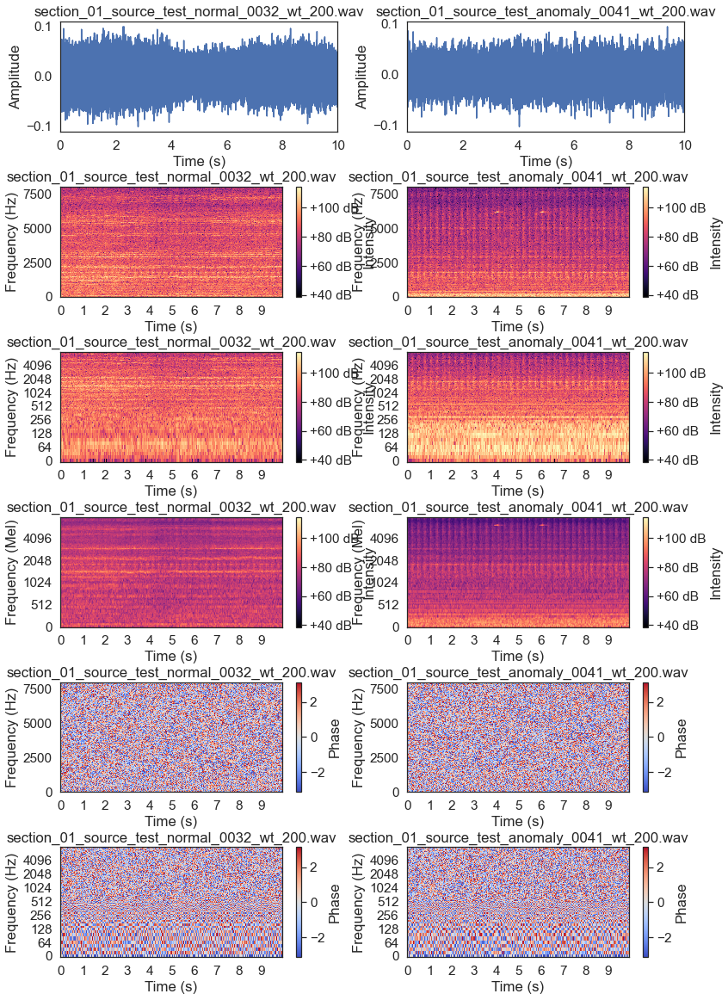

In [21]:
audio_1, sr = load_audio(sound_1['filepath'])
audio_2, sr = load_audio(sound_2['filepath'])


# Identify the min and max to adapt the colorscale
n_fft = 1024       # puissances de 2 : 2048, 4096, 8192, 16384 etc ...
magnitude_1, _ = spectrogram(audio_1, n_fft = 1024, hop_length = int(n_fft/2))
magnitude_2, _ = spectrogram(audio_2, n_fft = 1024, hop_length = int(n_fft/2))
vmin = np.max([np.min(magnitude_1), np.min(magnitude_2)])
vmax= np.min([np.max(magnitude_1), np.max(magnitude_2)])


#%matplotlib notebook
%matplotlib inline
fig = plt.figure(figsize = (13, 20), num = machine_str + " : comparison against " + comp_feature)
gs = gridspec.GridSpec(6, 2, wspace=0.25, hspace=0.5, height_ratios=None, figure=fig)
ax = fig.add_subplot(gs[0, 0])
plot_audio(audio_1, sr, ax = ax, title = sound_1['filename'])
ax = fig.add_subplot(gs[0, 1])
plot_audio(audio_2, sr, ax = ax, title = sound_2['filename'])

# Warning - Slow 
#ax = fig.add_subplot(gs[1, 0])
#plot_dft_amplitude(audio_1, sr, ax = ax, title = sound_1['filename'])
#ax = fig.add_subplot(gs[1, 1])
#plot_dft_amplitude(audio_2, sr, ax = ax, title = sound_2['filename'])
#
# Warning - Slow - Looks wrong
#ax = fig.add_subplot(gs[2, 0])
#plot_dft_phase(audio_1, sr, ax = ax, title = sound_1['filename'])
#ax = fig.add_subplot(gs[2, 1])
#plot_dft_phase(audio_2, sr, ax = ax, title = sound_2['filename'])

ax = fig.add_subplot(gs[1, 0])
plot_mag_spectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     scale = 'linear', ax = ax, title = sound_1['filename'], vmin = vmin, vmax = vmax)
ax = fig.add_subplot(gs[2, 0])
plot_mag_spectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     scale = 'log', ax = ax, title = sound_1['filename'], vmin = vmin, vmax = vmax)
ax = fig.add_subplot(gs[3, 0])
plot_mag_melspectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     ax = ax, title = sound_1['filename'], vmin = vmin, vmax = vmax)
ax = fig.add_subplot(gs[4, 0])
plot_phase_spectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                       scale = 'linear', ax = ax, title = sound_1['filename'])
ax = fig.add_subplot(gs[5, 0])
plot_phase_spectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                       scale = 'log', ax = ax, title = sound_1['filename'])

ax = fig.add_subplot(gs[1, 1])
plot_mag_spectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     scale = 'linear', ax = ax, title = sound_2['filename'], vmin = vmin, vmax = vmax)
ax = fig.add_subplot(gs[2, 1])
plot_mag_spectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     scale = 'log', ax = ax, title = sound_2['filename'], vmin = vmin, vmax = vmax)
ax = fig.add_subplot(gs[3, 1])
plot_mag_melspectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     ax = ax, title = sound_2['filename'], vmin = vmin, vmax = vmax)
ax = fig.add_subplot(gs[4, 1])
plot_phase_spectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                       scale = 'linear', ax = ax, title = sound_2['filename'])
ax = fig.add_subplot(gs[5, 1])
plot_phase_spectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                       scale = 'log', ax = ax, title = sound_2['filename'])

The 2 high-pitched sound events at $t \approx 4$ and $6$ s in the anormal sound 'section_01_source_test_anomaly_0041_wt_200.wav' are visible as 2 small segments in the spectrograms around $f \approx 6200$ Hz.

The sound background in the anormal sound 'section_01_source_test_anomaly_0018_wt_200.wav' is visible in the spectrogram between $t=0$ till $t\approx 6$s.  

### Case 2 - Compare source domain *vs* target domain sounds with the same section, sound_type

In [22]:
# Choose the features here
machine_str = 'gearbox'
comp_feature = 'domain_env'      # We will compare two sounds wih different domains
features_dict = {'dir': 'train',     # 'test' or 'train'
                 'sound_type': 'normal',   # 'normal' (or 'anomaly' if 'dir'=='test')
                 'section': 0         # 0, 1, or 2 (note we are only looking at the dev set for now)
                }

seed_att = 21      # For random selection of the attribute in the filtered data
seed_sample = 5         # Choose randomly among the samples which are filtered

# Filter the data set accordindly
sound_1, sound_2 = choose_two_sounds_to_compare(machine_str, features_dict, comp_feature = comp_feature, \
                                                seed_att = seed_att, seed_sample = seed_sample)

### Hear sounds from the source and target domains with other same "features"

In [23]:
print("Machine = ", machine_str)

print("--> Source domain sound")
print(sound_1['filename'])
audio, sr = load_audio(sound_1['filepath'])
display(ipd.Audio(audio, rate = sr))

print("--> Target domain sound")
print(sound_2['filename'])
audio, sr = load_audio(sound_2['filepath'])
display(ipd.Audio(audio, rate = sr))


Machine =  gearbox
--> Source domain sound
section_00_source_train_normal_0541_volt_2.5.wav


--> Target domain sound
section_00_target_train_normal_0007_volt_1.8.wav


### Analyze sound plots and various spectra

<IPython.core.display.Javascript object>


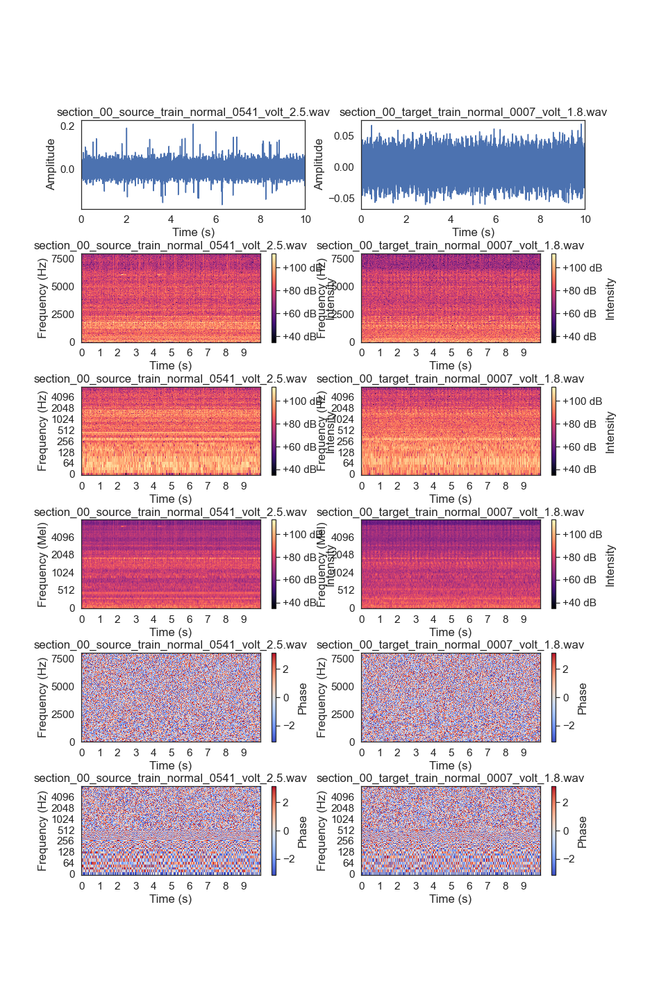

C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:63: FutureWarning: Pass y=[0.02813721 0.0317688  0.01992798 ... 0.01257324 0.01834106 0.01394653] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)
C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:63: FutureWarning: Pass y=[ 0.0111084   0.02645874  0.01312256 ... -0.0039978  -0.00262451
 -0.00476074] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)


In [24]:
audio_1, sr = load_audio(sound_1['filepath'])
audio_2, sr = load_audio(sound_2['filepath'])

# Identify the min and max to adapt the colorscale
n_fft = 1024       # puissances de 2 : 2048, 4096, 8192, 16384 etc ...
magnitude_1, _ = spectrogram(audio_1, n_fft = 1024, hop_length = int(n_fft/2))
magnitude_2, _ = spectrogram(audio_2, n_fft = 1024, hop_length = int(n_fft/2))
vmin = np.max([np.min(magnitude_1), np.min(magnitude_2)])
vmax= np.min([np.max(magnitude_1), np.max(magnitude_2)])

# Plotting
%matplotlib notebook
fig = plt.figure(figsize = (13, 20), num = machine_str + " : comparison against " + comp_feature)
gs = gridspec.GridSpec(6, 2, wspace=0.25, hspace=0.5, height_ratios=None, figure=fig)
ax = fig.add_subplot(gs[0, 0])
plot_audio(audio_1, sr, ax = ax, title = sound_1['filename'])
ax = fig.add_subplot(gs[0, 1])
plot_audio(audio_2, sr, ax = ax, title = sound_2['filename'])

# Warning - Slow 
#ax = fig.add_subplot(gs[1, 0])
#plot_dft_amplitude(audio_1, sr, ax = ax, title = sound_1['filename'])
#ax = fig.add_subplot(gs[1, 1])
#plot_dft_amplitude(audio_2, sr, ax = ax, title = sound_2['filename'])
#
# Warning - Slow - Looks wrong
#ax = fig.add_subplot(gs[2, 0])
#plot_dft_phase(audio_1, sr, ax = ax, title = sound_1['filename'])
#ax = fig.add_subplot(gs[2, 1])
#plot_dft_phase(audio_2, sr, ax = ax, title = sound_2['filename'])


ax = fig.add_subplot(gs[1, 0])
plot_mag_spectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     scale = 'linear', ax = ax, title = sound_1['filename'], vmin = vmin, vmax = vmax)
ax = fig.add_subplot(gs[2, 0])
plot_mag_spectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     scale = 'log', ax = ax, title = sound_1['filename'], vmin = vmin, vmax = vmax)
ax = fig.add_subplot(gs[3, 0])
plot_mag_melspectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     ax = ax, title = sound_1['filename'], vmin = vmin, vmax = vmax)
ax = fig.add_subplot(gs[4, 0])
plot_phase_spectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                       scale = 'linear', ax = ax, title = sound_1['filename'])
ax = fig.add_subplot(gs[5, 0])
plot_phase_spectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                       scale = 'log', ax = ax, title = sound_1['filename'])

ax = fig.add_subplot(gs[1, 1])
plot_mag_spectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     scale = 'linear', ax = ax, title = sound_2['filename'], vmin = vmin, vmax = vmax)
ax = fig.add_subplot(gs[2, 1])
plot_mag_spectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     scale = 'log', ax = ax, title = sound_2['filename'], vmin = vmin, vmax = vmax)
ax = fig.add_subplot(gs[3, 1])
plot_mag_melspectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     ax = ax, title = sound_2['filename'], vmin = vmin, vmax = vmax)
ax = fig.add_subplot(gs[4, 1])
plot_phase_spectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                       scale = 'linear', ax = ax, title = sound_2['filename'])
ax = fig.add_subplot(gs[5, 1])
plot_phase_spectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                       scale = 'log', ax = ax, title = sound_2['filename'])

### Come back to an anomalous sound which can be identified with the hear and see if the anomaly is still present if we change the attribute but not the id of the machine

In [25]:
sound = sound_from_file('section_01_source_test_anomaly_0041_wt_200.wav', machine_str = 'gearbox', dataset = 'test')
print(sound['filename'])
audio, sr = load_audio(sound['filepath'])
display(ipd.Audio(audio, rate = sr))

sound = sound_from_file('section_01_target_test_anomaly_0041_wt_180.wav', machine_str = 'gearbox', dataset = 'test')
print(sound['filename'])
audio, sr = load_audio(sound['filepath'])
display(ipd.Audio(audio, rate = sr))

section_01_source_test_anomaly_0041_wt_200.wav


section_01_target_test_anomaly_0041_wt_180.wav


The high-pitched anomalous sound at $t\approx 4$ and $6$s in 'section_01_source_test_anomaly_0041_wt_200.wav' is absent in 'section_01_target_test_anomaly_0041_wt_180.wav'. Question:
 * Is the ID of the machine (here 0041) an unambigous ID number of the machine ie two sounds with the same ID are recorded on the same machine but with different environment/regime conditions,
 * or is the ID of the machine just a way to number the files without relevant meaning? 
 
**To be continued ...**

### Try to reproduce fig1 of arxiv:2111.06539 (2021)
Two sounds from sliders with different velocities

In [26]:
sound_1 = sound_from_file('section_00_source_train_normal_0011_vel_300.wav', machine_str = 'slider', dataset = 'train')
print(sound_1['filename'])
audio_1, sr = load_audio(sound_1['filepath'])
display(ipd.Audio(audio_1, rate = sr))

sound_2 = sound_from_file('section_00_source_train_normal_0012_vel_700.wav', machine_str = 'slider', dataset = 'train')
print(sound_2['filename'])
audio_2, sr = load_audio(sound_2['filepath'])
display(ipd.Audio(audio_2, rate = sr))

section_00_source_train_normal_0011_vel_300.wav


section_00_source_train_normal_0012_vel_700.wav


<IPython.core.display.Javascript object>


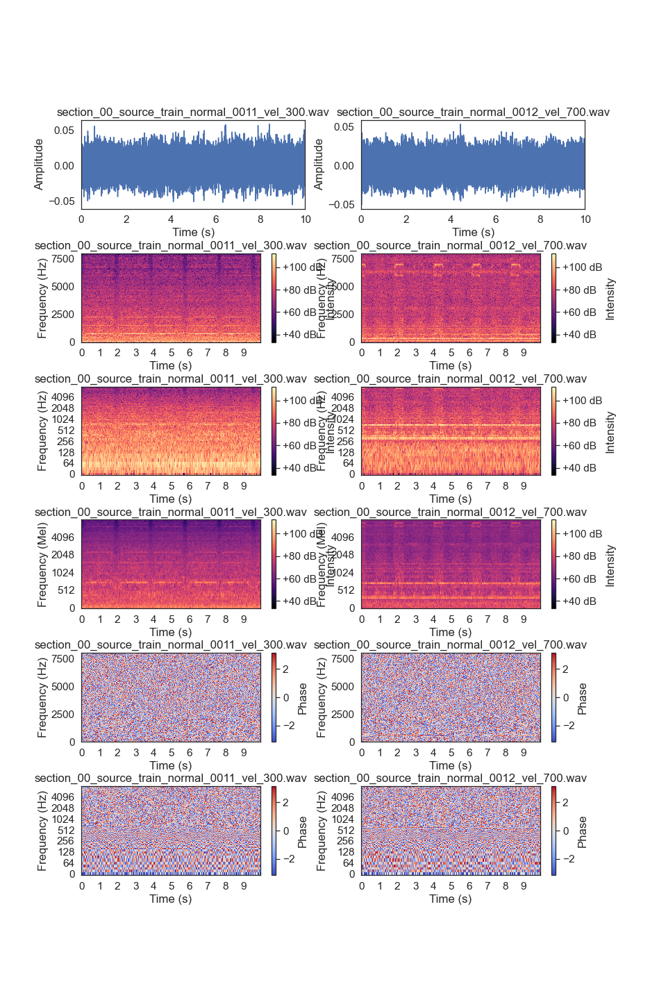

C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:63: FutureWarning: Pass y=[-0.00701904 -0.01461792 -0.0173645  ...  0.01000977  0.01229858
  0.00421143] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)
C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:63: FutureWarning: Pass y=[ 0.01293945 -0.00238037 -0.00604248 ...  0.01239014  0.01925659
  0.01931763] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)


In [27]:
audio_1, sr = load_audio(sound_1['filepath'])
audio_2, sr = load_audio(sound_2['filepath'])

# Identify the min and max to adapt the colorscale
n_fft = 1024       # puissances de 2 : 2048, 4096, 8192, 16384 etc ...
magnitude_1, _ = spectrogram(audio_1, n_fft = 1024, hop_length = int(n_fft/2))
magnitude_2, _ = spectrogram(audio_2, n_fft = 1024, hop_length = int(n_fft/2))
vmin = np.max([np.min(magnitude_1), np.min(magnitude_2)])
vmax= np.min([np.max(magnitude_1), np.max(magnitude_2)])

# Plotting
%matplotlib notebook
fig = plt.figure(figsize = (13, 20), num = 'slider -- two velocities')
gs = gridspec.GridSpec(6, 2, wspace=0.25, hspace=0.5, height_ratios=None, figure=fig)
ax = fig.add_subplot(gs[0, 0])
plot_audio(audio_1, sr, ax = ax, title = sound_1['filename'])
ax = fig.add_subplot(gs[0, 1])
plot_audio(audio_2, sr, ax = ax, title = sound_2['filename'])

# Warning - Slow 
#ax = fig.add_subplot(gs[1, 0])
#plot_dft_amplitude(audio_1, sr, ax = ax, title = sound_1['filename'])
#ax = fig.add_subplot(gs[1, 1])
#plot_dft_amplitude(audio_2, sr, ax = ax, title = sound_2['filename'])
#
# Warning - Slow - Looks wrong
#ax = fig.add_subplot(gs[2, 0])
#plot_dft_phase(audio_1, sr, ax = ax, title = sound_1['filename'])
#ax = fig.add_subplot(gs[2, 1])
#plot_dft_phase(audio_2, sr, ax = ax, title = sound_2['filename'])


ax = fig.add_subplot(gs[1, 0])
plot_mag_spectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     scale = 'linear', ax = ax, title = sound_1['filename'], vmin = vmin, vmax = vmax)
ax = fig.add_subplot(gs[2, 0])
plot_mag_spectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     scale = 'log', ax = ax, title = sound_1['filename'], vmin = vmin, vmax = vmax)
ax = fig.add_subplot(gs[3, 0])
plot_mag_melspectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     ax = ax, title = sound_1['filename'], vmin = vmin, vmax = vmax)
ax = fig.add_subplot(gs[4, 0])
plot_phase_spectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                       scale = 'linear', ax = ax, title = sound_1['filename'])
ax = fig.add_subplot(gs[5, 0])
plot_phase_spectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                       scale = 'log', ax = ax, title = sound_1['filename'])

ax = fig.add_subplot(gs[1, 1])
plot_mag_spectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     scale = 'linear', ax = ax, title = sound_2['filename'], vmin = vmin, vmax = vmax)
ax = fig.add_subplot(gs[2, 1])
plot_mag_spectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     scale = 'log', ax = ax, title = sound_2['filename'], vmin = vmin, vmax = vmax)
ax = fig.add_subplot(gs[3, 1])
plot_mag_melspectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     ax = ax, title = sound_2['filename'], vmin = vmin, vmax = vmax)
ax = fig.add_subplot(gs[4, 1])
plot_phase_spectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                       scale = 'linear', ax = ax, title = sound_2['filename'])
ax = fig.add_subplot(gs[5, 1])
plot_phase_spectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                       scale = 'log', ax = ax, title = sound_2['filename'])

## Figures for the report

In [28]:
# Choose the sound 
# 'section_00_source_train_normal_0011_vel_300.wav' from 'slider'
# 'section_00_source_train_normal_0014_volt_1.0.wav' from'gearbox'
# 'section_00_source_train_normal_0009_car_A1_spd_28V_mic_1_noise_1.wav' from 'ToyCar'
machine = 'slider'
filename = 'section_00_source_train_normal_0011_vel_300.wav'

sound = sound_from_file(filename, machine_str = machine, dataset = 'train')
audio, sr = load_audio(sound['filepath'])

# Hear it
display(ipd.Audio(audio, rate = sr))

<IPython.core.display.Javascript object>


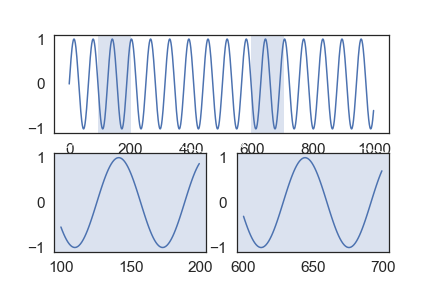

In [29]:
# Test for zooming
# Taken from https://stackoverflow.com/questions/44670708/draw-line-on-top-of-subplot-to-render-a-zoom-effect
from matplotlib.transforms import Bbox, TransformedBbox, blended_transform_factory

from mpl_toolkits.axes_grid1.inset_locator import BboxPatch, BboxConnector,\
    BboxConnectorPatch


def connect_bbox(bbox1, bbox2,
                 loc1a, loc2a, loc1b, loc2b,
                 prop_lines, prop_patches=None):
    if prop_patches is None:
        prop_patches = prop_lines.copy()
        prop_patches["alpha"] = prop_patches.get("alpha", 1)*0.2

    c1 = BboxConnector(bbox1, bbox2, loc1=loc1a, loc2=loc2a, **prop_lines)
    c1.set_clip_on(False)
    c2 = BboxConnector(bbox1, bbox2, loc1=loc1b, loc2=loc2b, **prop_lines)
    c2.set_clip_on(False)

    bbox_patch1 = BboxPatch(bbox1, **prop_patches)
    bbox_patch2 = BboxPatch(bbox2, **prop_patches)

    p = BboxConnectorPatch(bbox1, bbox2,
                           loc1a=loc1a, loc2a=loc2a, loc1b=loc1b, loc2b=loc2b,
                           **prop_patches)
    p.set_clip_on(False)

    return c1, c2, bbox_patch1, bbox_patch2, p




def zoom_effect02(ax1, ax2, **kwargs):
    """
    ax2 : the big main axes
    ax1 : the zoomed axes
    The xmin & xmax will be taken from the
    ax1.viewLim.
    """

    tt = ax1.transScale + (ax1.transLimits + ax2.transAxes)
    trans = blended_transform_factory(ax2.transData, tt)

    mybbox1 = ax1.bbox
    mybbox2 = TransformedBbox(ax1.viewLim, trans)

    prop_patches = kwargs.copy()
    prop_patches["ec"] = "none"
    prop_patches["alpha"] = 0.2

    c1, c2, bbox_patch1, bbox_patch2, p = \
        connect_bbox(mybbox1, mybbox2,
                     loc1a=2, loc2a=3, loc1b=1, loc2b=4, 
                     prop_lines=kwargs, prop_patches=prop_patches)

    ax1.add_patch(bbox_patch1)
    ax2.add_patch(bbox_patch2)
    ax2.add_patch(c1)
    ax2.add_patch(c2)
    ax2.add_patch(p)

    return c1, c2, bbox_patch1, bbox_patch2, p


import matplotlib.pyplot as plt
import numpy as np

t=np.arange(1000)
x=np.sin(np.arange(1000)/10.)

plt.figure()
ax1 = plt.subplot(2,1,1)
plt.plot(t,x)

ax2 = plt.subplot(2,2,3)
plt.plot(t[100:200],x[100:200])
zoom_effect02(ax2, ax1)
ax3 = plt.subplot(2,2,4)
plt.plot(t[600:700],x[600:700])
zoom_effect02(ax3, ax1)
plt.show()

<IPython.core.display.Javascript object>


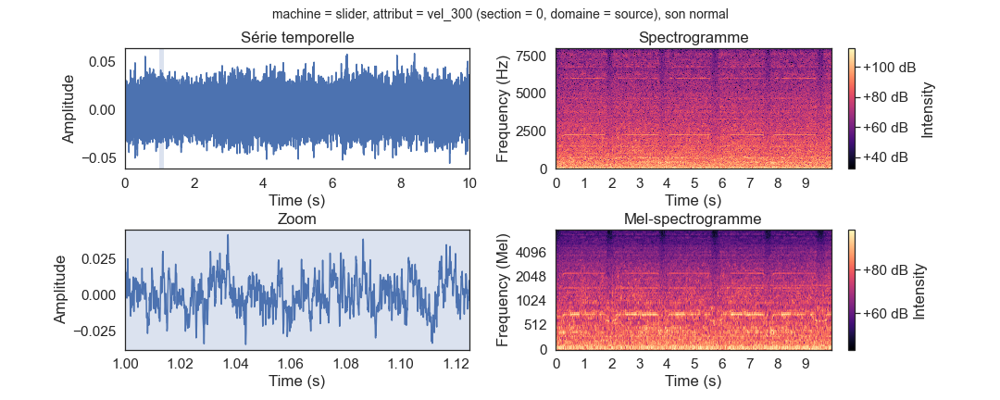

C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:63: FutureWarning: Pass y=[-0.00701904 -0.01461792 -0.0173645  ...  0.01000977  0.01229858
  0.00421143] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)


In [30]:
# Identify the min and max to adapt the colorscale
n_fft = 1024       # puissances de 2 : 2048, 4096, 8192, 16384 etc ...
#magnitude, _ = spectrogram(audio, n_fft = n_fft, hop_length = int(n_fft/2))
#vmin = np.min(magnitude)
#vmax = np.max(magnitude)

# Plot the sound wave and the spectrograms
fig = plt.figure(figsize = (15, 6))
fig.suptitle("machine = " + machine + ", attribut = " + sound['suffix']  \
           + " (section = " + str(sound['section']) + ", domaine = " + sound['domain_env'] \
           + "), son normal", size = 14)
gs = gridspec.GridSpec(2, 2, wspace=0.25, hspace=0.5, height_ratios=None, figure=fig)

# Plot the sound wave 
ax1 = fig.add_subplot(gs[0, 0])
plot_audio(audio, sr, ax = ax1, xlim = (0, 10), title = 'Série temporelle')

# Plot the sound wave only in small temporal section
ax2 = fig.add_subplot(gs[1, 0])
times =  1/sr * np.arange(0, len(audio))
ax2.plot(times[16000:16000+2000], audio[16000:16000+2000])
ax2.set_xlabel('Time (s)')
ax2.set_ylabel('Amplitude', zorder = 1)
ax2.set_xlim(1, 1.125)
ax2.set_title("Zoom")


zoom_effect02(ax2, ax1, linestyle = '--', zorder = -1)

# Plot the spectogram in linear scale
ax3 = fig.add_subplot(gs[0, 1])
plot_mag_spectrogram(audio, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     scale = 'linear', ax = ax3, title = 'Spectrogramme')

# Plot the melspectogram 
ax4 = fig.add_subplot(gs[1, 1])
plot_mag_melspectrogram(audio, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     ax = ax4, title = 'Mel-spectrogramme')

##### Compare two normal vs anormal sounds with the same attribute

Machine =  gearbox
--> Normal sound
section_00_source_test_normal_0043_volt_1.5.wav


--> Anormal sound
section_00_source_test_anomaly_0028_volt_1.5.wav


C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:35: FutureWarning: Pass y=[-0.00939941 -0.02008057 -0.01226807 ... -0.00933838 -0.00665283
 -0.00738525] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)
C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:35: FutureWarning: Pass y=[-0.00390625  0.00836182  0.01052856 ... -0.0062561  -0.0043335
  0.00180054] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)


<IPython.core.display.Javascript object>


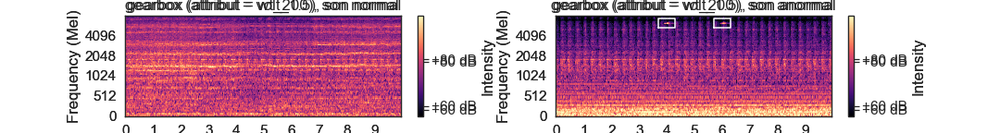

C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:63: FutureWarning: Pass y=[-0.00939941 -0.02008057 -0.01226807 ... -0.00933838 -0.00665283
 -0.00738525] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)
C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:63: FutureWarning: Pass y=[-0.00390625  0.00836182  0.01052856 ... -0.0062561  -0.0043335
  0.00180054] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)


In [31]:
# Choose the features here
machine_str = 'gearbox'
comp_feature = 'sound_type'      # We will compare two sounds wih different sound_type ie normal and anormal sounds
features_dict = {'domain': 'source',     # 'source' or 'target'
                 'section': 0         # 0, 1, or 2 (note we are only looking at the dev set for now)
                }

seed_att = 10      # For random selection of the attribute in the same domain and in the same section
seed_sample = 0         # Choose randomly among the samples which are filtered

# Filter the data set accordindly
sound_1, sound_2 = choose_two_sounds_to_compare(machine_str, features_dict, comp_feature = comp_feature, \
                                                seed_att = seed_att, seed_sample = seed_sample)

# Hear the sounds
print("Machine = ", machine_str)

print("--> Normal sound")
print(sound_1['filename'])
audio_1, sr = load_audio(sound_1['filepath'])
display(ipd.Audio(audio_1, rate = sr))

print("--> Anormal sound")
print(sound_2['filename'])
audio_2, sr = load_audio(sound_2['filepath'])
display(ipd.Audio(audio_2, rate = sr))


# Plot the spectrograms

# .. Identify the min and max to adapt the colorscale
n_fft = 1024       # puissances de 2 : 2048, 4096, 8192, 16384 etc ...
magnitude_1 = melspectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2))
magnitude_2 = melspectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2))
vmin = np.max([np.min(magnitude_1), np.min(magnitude_2)])
vmax= np.min([np.max(magnitude_1), np.max(magnitude_2)])


fig = plt.figure(figsize = (15, 2), num = machine_str + " : comparison against " + comp_feature)
gs = gridspec.GridSpec(1, 2, wspace=0.25, hspace=0.5, height_ratios=None, figure=fig)
title = machine_str + " (attribut = " + sound_1['suffix'] + "), "

ax = fig.add_subplot(gs[0, 0])
plot_mag_melspectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     ax = ax, title = title + 'son normal', vmin = vmin, vmax = vmax)

ax = fig.add_subplot(gs[0, 1])
plot_mag_melspectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     ax = ax, title = title + 'son anormal', vmin = vmin, vmax = vmax)


In [32]:
# Choose the features here
machine_str = 'gearbox'
comp_feature = 'sound_type'      # We will compare two sounds wih different sound_type ie normal and anormal sounds
features_dict = {'domain': 'source',     # 'source' or 'target'
                 'section': 1         # 0, 1, or 2 (note we are only looking at the dev set for now)
                }

seed_att = 12      # For random selection of the attribute in the same domain and in the same section
seed_sample = 1         # Choose randomly among the samples which are filtered

# Filter the data set accordindly
sound_1, sound_2 = choose_two_sounds_to_compare(machine_str, features_dict, comp_feature = comp_feature, \
                                                seed_att = seed_att, seed_sample = seed_sample)

# Hear the sounds
print("Machine = ", machine_str)

print("--> Normal sound")
print(sound_1['filename'])
audio_1, sr = load_audio(sound_1['filepath'])
display(ipd.Audio(audio_1, rate = sr))

print("--> Anormal sound")
print(sound_2['filename'])
audio_2, sr = load_audio(sound_2['filepath'])
display(ipd.Audio(audio_2, rate = sr))


# Plot the spectrograms

# .. Identify the min and max to adapt the colorscale
n_fft = 1024       # puissances de 2 : 2048, 4096, 8192, 16384 etc ...
magnitude_1 = melspectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2))
magnitude_2 = melspectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2))
vmin = np.max([np.min(magnitude_1), np.min(magnitude_2)])
vmax= np.min([np.max(magnitude_1), np.max(magnitude_2)])


fig = plt.figure(figsize = (15, 2), num = machine_str + " : comparison against " + comp_feature)
gs = gridspec.GridSpec(1, 2, wspace=0.25, hspace=0.5, height_ratios=None, figure=fig)
title = machine_str + " (attribut = " + sound_1['suffix'] + "), "

ax = fig.add_subplot(gs[0, 0])
plot_mag_melspectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     ax = ax, title = title + 'son normal', vmin = vmin, vmax = vmax)

ax = fig.add_subplot(gs[0, 1])
plot_mag_melspectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     ax = ax, title = title + 'son anormal', vmin = vmin, vmax = vmax)

# Draw rectangles to show the anomalies identified by listening to the sounds
xs = [3.7, 4.3, 4.3, 3.7, 3.7]
ys = [5300, 5300, 7500, 7500, 5300]
ax.plot(xs, ys, color = "white")
xs = [5.7, 6.3, 6.3, 5.7, 5.7]
ys = [5300, 5300, 7500, 7500, 5300]
ax.plot(xs, ys, color = "white")


Machine =  gearbox
--> Normal sound
section_01_source_test_normal_0032_wt_200.wav


--> Anormal sound
section_01_source_test_anomaly_0041_wt_200.wav


C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:35: FutureWarning: Pass y=[-0.00183105 -0.00521851 -0.02407837 ... -0.03848267 -0.03018188
  0.00390625] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)
C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:35: FutureWarning: Pass y=[0.0289917  0.02227783 0.01998901 ... 0.02227783 0.03146362 0.03305054] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)
C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:63: FutureWarning: Pass y=[-0.00183105 -0.00521851 -0.02407837 ... -0.03848267 -0.03018188
  0.00390625] as keyword args. From version 0.10 passing these as positional arguments will result in an err

Machine =  ToyCar
--> Normal sound
section_01_source_test_normal_0017_car_A2_spd_40V_mic_1_noise_1.wav


--> Anormal sound
section_01_source_test_anomaly_0020_car_A2_spd_40V_mic_1_noise_1.wav


C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:35: FutureWarning: Pass y=[-0.00524902 -0.00488281 -0.00534058 ... -0.01123047 -0.00274658
  0.00772095] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)
C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:35: FutureWarning: Pass y=[-0.00314331 -0.00247192  0.0022583  ...  0.03063965  0.02352905
  0.01751709] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)


<IPython.core.display.Javascript object>


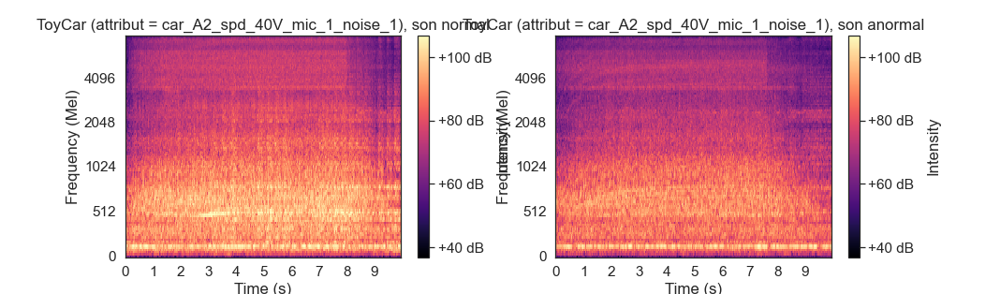

C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:63: FutureWarning: Pass y=[-0.00524902 -0.00488281 -0.00534058 ... -0.01123047 -0.00274658
  0.00772095] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)
C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:63: FutureWarning: Pass y=[-0.00314331 -0.00247192  0.0022583  ...  0.03063965  0.02352905
  0.01751709] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)


In [33]:
# Choose the features here
machine_str = 'ToyCar'
comp_feature = 'sound_type'      # We will compare two sounds wih different sound_type ie normal and anormal sounds
features_dict = {'domain': 'source',     # 'source' or 'target'
                 'section': 1         # 0, 1, or 2 (note we are only looking at the dev set for now)
                }

seed_att = 12      # For random selection of the attribute in the same domain and in the same section
seed_sample = 1         # Choose randomly among the samples which are filtered

# Filter the data set accordindly
sound_1, sound_2 = choose_two_sounds_to_compare(machine_str, features_dict, comp_feature = comp_feature, \
                                                seed_att = seed_att, seed_sample = seed_sample)

# Hear the sounds
print("Machine = ", machine_str)

print("--> Normal sound")
print(sound_1['filename'])
audio_1, sr = load_audio(sound_1['filepath'])
display(ipd.Audio(audio_1, rate = sr))

print("--> Anormal sound")
print(sound_2['filename'])
audio_2, sr = load_audio(sound_2['filepath'])
display(ipd.Audio(audio_2, rate = sr))


# Plot the spectrograms

# .. Identify the min and max to adapt the colorscale
n_fft = 1024       # puissances de 2 : 2048, 4096, 8192, 16384 etc ...
magnitude_1 = melspectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2))
magnitude_2 = melspectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2))
vmin = np.max([np.min(magnitude_1), np.min(magnitude_2)])
vmax= np.min([np.max(magnitude_1), np.max(magnitude_2)])


fig = plt.figure(figsize = (15, 2), num = machine_str + " : comparison against " + comp_feature)
gs = gridspec.GridSpec(1, 2, wspace=0.25, hspace=0.5, height_ratios=None, figure=fig)
title = machine_str + " (attribut = " + sound_1['suffix'] + "), "

ax = fig.add_subplot(gs[0, 0])
plot_mag_melspectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     ax = ax, title = title + 'son normal', vmin = vmin, vmax = vmax)

ax = fig.add_subplot(gs[0, 1])
plot_mag_melspectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     ax = ax, title = title + 'son anormal', vmin = vmin, vmax = vmax)




##### Compare two normal sounds with the same attribute

Machine =  ToyCar
--> Normal sound
section_01_source_train_normal_0161_car_A2_spd_40V_mic_1_noise_1.wav


--> Anormal sound
section_01_source_train_normal_0454_car_A2_spd_40V_mic_1_noise_1.wav


C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:35: FutureWarning: Pass y=[ 0.00296021 -0.00238037 -0.00973511 ... -0.02154541 -0.02441406
 -0.02557373] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)
C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:35: FutureWarning: Pass y=[ 0.01818848  0.01617432  0.01135254 ... -0.0430603  -0.04043579
 -0.03964233] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)


<IPython.core.display.Javascript object>


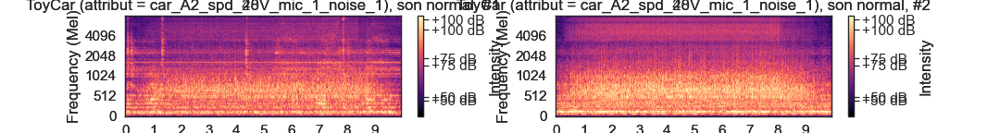

C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:63: FutureWarning: Pass y=[ 0.00296021 -0.00238037 -0.00973511 ... -0.02154541 -0.02441406
 -0.02557373] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)
C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:63: FutureWarning: Pass y=[ 0.01818848  0.01617432  0.01135254 ... -0.0430603  -0.04043579
 -0.03964233] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)


In [34]:
# Choose the features here
machine_str = 'ToyCar'
comp_feature = 'samples_with_same_attribute'      # compare two normal sounds from the train set with the same attribute
features_dict = {'domain': 'source',     # 'source' or 'target'
                 'section': 1         # 0, 1, or 2 (note we are only looking at the dev set for now)
                }

seed_att = 11      # For random selection of the attribute in the same domain and in the same section
seed_sample =1         # Choose randomly among the samples which are filtered

# Filter the data set accordindly
sound_1, sound_2 = choose_two_sounds_to_compare(machine_str, features_dict, comp_feature = comp_feature, \
                                                seed_att = seed_att, seed_sample = seed_sample)

# Hear the sounds
print("Machine = ", machine_str)

print("--> Normal sound")
print(sound_1['filename'])
audio_1, sr = load_audio(sound_1['filepath'])
display(ipd.Audio(audio_1, rate = sr))

print("--> Anormal sound")
print(sound_2['filename'])
audio_2, sr = load_audio(sound_2['filepath'])
display(ipd.Audio(audio_2, rate = sr))


# Plot the spectrograms

# .. Identify the min and max to adapt the colorscale
n_fft = 1024       # puissances de 2 : 2048, 4096, 8192, 16384 etc ...
magnitude_1 = melspectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2))
magnitude_2 = melspectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2))
vmin = np.max([np.min(magnitude_1), np.min(magnitude_2)])
vmax= np.min([np.max(magnitude_1), np.max(magnitude_2)])


fig = plt.figure(figsize = (15, 2), num = machine_str + " : comparison against " + comp_feature)
gs = gridspec.GridSpec(1, 2, wspace=0.25, hspace=0.5, height_ratios=None, figure=fig)
title = machine_str + " (attribut = " + sound_1['suffix'] + "), "

ax = fig.add_subplot(gs[0, 0])
plot_mag_melspectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     ax = ax, title = title + 'son normal, #1', vmin = vmin, vmax = vmax)

ax = fig.add_subplot(gs[0, 1])
plot_mag_melspectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     ax = ax, title = title + 'son normal, #2', vmin = vmin, vmax = vmax)


In [35]:
# Choose the features here
machine_str = 'ToyCar'
comp_feature = 'samples_with_same_attribute'      # compare two normal sounds from the train set with the same attribute
features_dict = {'domain': 'source',     # 'source' or 'target'
                 'section': 1         # 0, 1, or 2 (note we are only looking at the dev set for now)
                }

seed_att = 12      # For random selection of the attribute in the same domain and in the same section
seed_sample = 1         # Choose randomly among the samples which are filtered

# Filter the data set accordindly
sound_1, sound_2 = choose_two_sounds_to_compare(machine_str, features_dict, comp_feature = comp_feature, \
                                                seed_att = seed_att, seed_sample = seed_sample)

# Hear the sounds
print("Machine = ", machine_str)

print("--> Normal sound")
print(sound_1['filename'])
audio_1, sr = load_audio(sound_1['filepath'])
display(ipd.Audio(audio_1, rate = sr))

print("--> Anormal sound")
print(sound_2['filename'])
audio_2, sr = load_audio(sound_2['filepath'])
display(ipd.Audio(audio_2, rate = sr))


# Plot the spectrograms

# .. Identify the min and max to adapt the colorscale
n_fft = 1024       # puissances de 2 : 2048, 4096, 8192, 16384 etc ...
magnitude_1 = melspectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2))
magnitude_2 = melspectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2))
vmin = np.max([np.min(magnitude_1), np.min(magnitude_2)])
vmax= np.min([np.max(magnitude_1), np.max(magnitude_2)])


fig = plt.figure(figsize = (15, 2), num = machine_str + " : comparison against " + comp_feature)
gs = gridspec.GridSpec(1, 2, wspace=0.25, hspace=0.5, height_ratios=None, figure=fig)
title = machine_str + " (attribut = " + sound_1['suffix'] + "), "

ax = fig.add_subplot(gs[0, 0])
plot_mag_melspectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     ax = ax, title = title + 'son normal, #1', vmin = vmin, vmax = vmax)

ax = fig.add_subplot(gs[0, 1])
plot_mag_melspectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     ax = ax, title = title + 'son normal, #2', vmin = vmin, vmax = vmax)

Machine =  ToyCar
--> Normal sound
section_01_source_train_normal_0780_car_A2_spd_28V_mic_1_noise_1.wav


--> Anormal sound
section_01_source_train_normal_0949_car_A2_spd_28V_mic_1_noise_1.wav


C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:35: FutureWarning: Pass y=[-0.00741577  0.0020752   0.01345825 ...  0.00817871  0.0057373
  0.01464844] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)
C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:35: FutureWarning: Pass y=[ 0.021698    0.01776123  0.01345825 ... -0.00784302 -0.0078125
 -0.00942993] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)
C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:63: FutureWarning: Pass y=[-0.00741577  0.0020752   0.01345825 ...  0.00817871  0.0057373
  0.01464844] as keyword args. From version 0.10 passing these as positional arguments will result in an

Machine =  gearbox
--> Normal sound
section_01_source_train_normal_0203_wt_150.wav


--> Anormal sound
section_01_source_train_normal_0797_wt_150.wav


C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:35: FutureWarning: Pass y=[ 7.6293945e-03 -1.0192871e-02  3.0517578e-05 ...  5.4931641e-03
  1.2939453e-02  1.2847900e-02] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)
C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:35: FutureWarning: Pass y=[ 0.0425415   0.04000854  0.03955078 ... -0.02658081 -0.03436279
 -0.05032349] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)


<IPython.core.display.Javascript object>


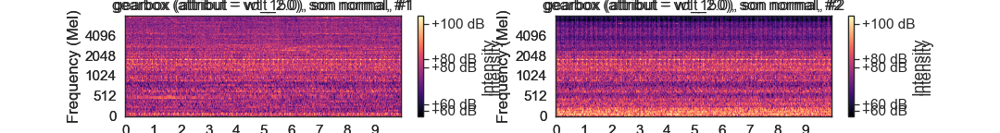

C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:63: FutureWarning: Pass y=[ 7.6293945e-03 -1.0192871e-02  3.0517578e-05 ...  5.4931641e-03
  1.2939453e-02  1.2847900e-02] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)
C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:63: FutureWarning: Pass y=[ 0.0425415   0.04000854  0.03955078 ... -0.02658081 -0.03436279
 -0.05032349] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)


In [36]:
# Choose the features here
machine_str = 'gearbox'
comp_feature = 'samples_with_same_attribute'      # compare two normal sounds from the train set with the same attribute
features_dict = {'domain': 'source',     # 'source' or 'target'
                 'section': 1         # 0, 1, or 2 (note we are only looking at the dev set for now)
                }

seed_att = 12      # For random selection of the attribute in the same domain and in the same section
seed_sample = 1         # Choose randomly among the samples which are filtered

# Filter the data set accordindly
sound_1, sound_2 = choose_two_sounds_to_compare(machine_str, features_dict, comp_feature = comp_feature, \
                                                seed_att = seed_att, seed_sample = seed_sample)

# Hear the sounds
print("Machine = ", machine_str)

print("--> Normal sound")
print(sound_1['filename'])
audio_1, sr = load_audio(sound_1['filepath'])
display(ipd.Audio(audio_1, rate = sr))

print("--> Anormal sound")
print(sound_2['filename'])
audio_2, sr = load_audio(sound_2['filepath'])
display(ipd.Audio(audio_2, rate = sr))


# Plot the spectrograms

# .. Identify the min and max to adapt the colorscale
n_fft = 1024       # puissances de 2 : 2048, 4096, 8192, 16384 etc ...
magnitude_1 = melspectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2))
magnitude_2 = melspectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2))
vmin = np.max([np.min(magnitude_1), np.min(magnitude_2)])
vmax= np.min([np.max(magnitude_1), np.max(magnitude_2)])


fig = plt.figure(figsize = (15, 2), num = machine_str + " : comparison against " + comp_feature)
gs = gridspec.GridSpec(1, 2, wspace=0.25, hspace=0.5, height_ratios=None, figure=fig)
title = machine_str + " (attribut = " + sound_1['suffix'] + "), "

ax = fig.add_subplot(gs[0, 0])
plot_mag_melspectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     ax = ax, title = title + 'son normal, #1', vmin = vmin, vmax = vmax)

ax = fig.add_subplot(gs[0, 1])
plot_mag_melspectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     ax = ax, title = title + 'son normal, #2', vmin = vmin, vmax = vmax)

In [37]:
# Choose the features here
machine_str = 'gearbox'
comp_feature = 'samples_with_same_attribute'      # compare two normal sounds from the train set with the same attribute
features_dict = {'domain': 'source',     # 'source' or 'target'
                 'section': 0         # 0, 1, or 2 (note we are only looking at the dev set for now)
                }

seed_att = 1      # For random selection of the attribute in the same domain and in the same section
seed_sample = 2         # Choose randomly among the samples which are filtered

# Filter the data set accordindly
sound_1, sound_2 = choose_two_sounds_to_compare(machine_str, features_dict, comp_feature = comp_feature, \
                                                seed_att = seed_att, seed_sample = seed_sample)

# Hear the sounds
print("Machine = ", machine_str)

print("--> Normal sound")
print(sound_1['filename'])
audio_1, sr = load_audio(sound_1['filepath'])
display(ipd.Audio(audio_1, rate = sr))

print("--> Anormal sound")
print(sound_2['filename'])
audio_2, sr = load_audio(sound_2['filepath'])
display(ipd.Audio(audio_2, rate = sr))


# Plot the spectrograms

# .. Identify the min and max to adapt the colorscale
n_fft = 1024       # puissances de 2 : 2048, 4096, 8192, 16384 etc ...
magnitude_1 = melspectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2))
magnitude_2 = melspectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2))
vmin = np.max([np.min(magnitude_1), np.min(magnitude_2)])
vmax= np.min([np.max(magnitude_1), np.max(magnitude_2)])


fig = plt.figure(figsize = (15, 2), num = machine_str + " : comparison against " + comp_feature)
gs = gridspec.GridSpec(1, 2, wspace=0.25, hspace=0.5, height_ratios=None, figure=fig)
title = machine_str + " (attribut = " + sound_1['suffix'] + "), "

ax = fig.add_subplot(gs[0, 0])
plot_mag_melspectrogram(audio_1, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     ax = ax, title = title + 'son normal, #1', vmin = vmin, vmax = vmax)

ax = fig.add_subplot(gs[0, 1])
plot_mag_melspectrogram(audio_2, sr, n_fft = n_fft, hop_length = int(n_fft/2), \
                     ax = ax, title = title + 'son normal, #2', vmin = vmin, vmax = vmax)

Machine =  gearbox
--> Normal sound
section_00_source_train_normal_0857_volt_2.0.wav


--> Anormal sound
section_00_source_train_normal_0950_volt_2.0.wav


C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:35: FutureWarning: Pass y=[-0.0039978  -0.00714111 -0.01098633 ...  0.00436401 -0.00204468
  0.00683594] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)
C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:35: FutureWarning: Pass y=[-0.01281738 -0.01083374 -0.00448608 ...  0.00973511  0.01052856
  0.01000977] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  M = librosa.feature.melspectrogram(audio, sr = sr, n_fft = n_fft, hop_length = hop_length, center = False)
C:\Users\genef\AppData\Local\Temp/ipykernel_416/1280607319.py:63: FutureWarning: Pass y=[-0.0039978  -0.00714111 -0.01098633 ...  0.00436401 -0.00204468
  0.00683594] as keyword args. From version 0.10 passing these as positional arguments will result in